<a href="https://colab.research.google.com/github/jsten07/cms_routing/blob/main/mergeData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

  Created wheel for motuclient: filename=motuclient-1.8.8-cp37-none-any.whl size=34207 sha256=5208d42abdd270b1b886a0bb8fe0ac1557d1e147ce445a38abaecc99093a722d
  Stored in directory: /root/.cache/pip/wheels/d6/d4/ab/5a80f4ca7b4fcee99e34601c4564af28798e6a99b3d9ada605
Successfully built motuclient


In [ ]:
!pip install wget

In [ ]:
import wget
import os
import pandas as pd 
from os import walk
from glob import glob
import numpy as np
from bs4 import BeautifulSoup
import requests
from tqdm import tqdm
import zipfile
from datetime import datetime, timedelta
from pathlib import Path

In [ ]:
def check_dir(year):
    history =[]
    for path, dirs, files in os.walk(str(year)):
        for file in files:
            if file.endswith('.csv'):
                history.append(file.split('.')[0])
    return history

In [ ]:
def download_AIS(year, zones):
    Path(str(year)).mkdir(parents=True, exist_ok=True)
    resume_download = check_dir(str(year))
    url = "https://coast.noaa.gov/htdata/CMSP/AISDataHandler/{0}/".format(year)
    html_text = requests.get(url).text
    soup = BeautifulSoup(html_text, 'html.parser')
    files = []
    for a in soup.find_all('a', href=True):
         if a.text and a.text.endswith('zip'):
            name, _ = a['href'].split('.')
            l = name.split('_')
            l.append(a.text)
            files.append(l) 

    df = pd.DataFrame(files)
    df.columns = [*df.columns[:-1], 'Files']
  
    for c in df.columns:
        if c == 'Files': continue
        unique_col = len(df[c].unique())
        if unique_col == 12 or unique_col == 6: # some years provid data only for 6 month
            df['Month'] = df[c]
        elif unique_col == 31:
            df['Days'] = df[c]
        elif 20 >= unique_col >= 18 or 'zone' in df[c][0].lower():
            if 'zone' in df[c][0].lower():
                df['Zone'] = pd.to_numeric([z[z.lower().find('zone')+4:]for z in df[c]])
            else:
                df['Zone'] = pd.to_numeric(df[c])
        del df[c]
    
    #  download
    if 'Zone' in df.columns:
        dl = df[df['Zone'].isin(zones)][['Files','Zone']]
    else:
        dl = df[['Files','Month']]
    for file, zone in tqdm(dl.values.tolist()):
        output = '%s_%s' % (year, str(zone))
        Path(str(year)).joinpath(output).mkdir(parents=True, exist_ok=True)
        if file.split('.')[0] in resume_download: continue
        print(file)
        wget.download(os.path.join(url,file)) 
        with zipfile.ZipFile(file, 'r') as zip_ref:
            zip_ref.extractall(os.path.join(str(year), output))
        os.remove(file)

In [ ]:
def normalize_dates(date): 
    date = date.replace(second=0)
    if date.minute > 45:
        return date + timedelta(hours=0, minutes=(60-date.minute))  
    else:
        return date - timedelta(hours=0, minutes=date.minute)  
   
    
    
def subset_AIS_to_CSV(year, min_time_interval = 60):
    data_list = []
    for path, dirs, files in os.walk(str(year)):
        for file in files:
                if file.endswith('.csv'):
                    x = os.path.join(path, file)
                    print(x)
                    df = pd.read_csv(x)
                    df = df.drop(['MMSI', 'VesselName', 'CallSign', 'Cargo', 'TranscieverClass'], axis=1, errors='ignore')
                    df = df.dropna()
                    df = df.query('(Status == "under way using engine" or Status == 8) & (VesselType in [1016, 1003, 1004] or 79 >= VesselType >= 70) & SOG > 5 & Length > 3 & Width > 3 & Draft > 3 ')
                    
                    # parse and normalize utc time 
                    df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S').apply(normalize_dates) # 2017-01-01T01:30:10
                    df.index = df.BaseDateTime
                    df = df.resample("%dT" % min_time_interval).last()
                    data_list.extend(df.values)
             
    df = pd.DataFrame(data_list, columns=['BaseDateTime', 'LAT', 'LON', 'SOG', 'COG', 'Heading',  'IMO', 'VesselType', 'Status', 'Length','Width', 'Draft'])
    df = df.dropna()
    df = df[df['BaseDateTime'] >= datetime(2016,3,1,3)]
    df.to_csv(os.path.join(str(year), '%s_AIS.csv' % str(year)))
    return df

In [ ]:
def show_plotly(dataframe):
    import plotly.express as px
    fig = px.scatter_mapbox(dataframe,
                        lat=dataframe.LAT,
                        lon=dataframe.LON, color='SOG', mapbox_style="stamen-toner")
    fig.update_geos(
        lataxis_range=[dataframe.LAT.min(),dataframe.LAT.max()], lonaxis_range=[dataframe.LON.min(), dataframe.LON.max()]
    )
    fig.show()

In [ ]:
download_AIS(2020, zones=list(range(9,20)))

 25%|██▍       | 91/366 [30:29<1:34:33, 20.63s/it]

AIS_2020_04_01.zip


KeyboardInterrupt: ignored

In [ ]:
subset_AIS_to_CSV(year='2020', min_time_interval = 20)

2020/2020_02/AIS_2020_02_14.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_29.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_08.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_09.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_24.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_06.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_22.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_10.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_07.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_25.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_15.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_17.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_05.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_02.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_04.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_12.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_03.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_20.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_13.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_11.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_28.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_01.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_27.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_18.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_21.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_19.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_16.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_23.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_02/AIS_2020_02_26.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_23.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_17.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_11.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_24.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_07.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_16.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_02.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_21.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_25.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_28.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_26.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_31.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_27.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_30.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_14.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_12.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_08.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_04.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_03.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_22.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_20.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_09.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_18.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_29.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_19.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_01.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_10.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_05.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_15.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_13.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_03/AIS_2020_03_06.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_04/AIS_2020_04_01.csv


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_27.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_24.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_21.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_26.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_31.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_16.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_28.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_10.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_14.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_12.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_20.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_06.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_03.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_13.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_01.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_04.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_23.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_15.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_19.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_08.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_05.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_07.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_02.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_29.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_18.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_11.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_22.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_17.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_30.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_25.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2020/2020_01/AIS_2020_01_09.csv


/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,BaseDateTime,LAT,LON,SOG,COG,Heading,IMO,VesselType,Status,Length,Width,Draft
0,2020-02-14 00:00:00,37.91837,-123.02313,15.5,-110.1,302.0,IMO9337470,70.0,0.0,333.0,42.0,14.5
3,2020-02-14 01:00:00,30.68911,-120.12384,10.7,-153.4,257.0,IMO9430856,70.0,0.0,189.0,32.0,12.6
6,2020-02-14 02:00:00,34.33048,-124.64622,13.4,-141.3,272.0,IMO9690547,70.0,0.0,199.0,35.0,9.0
9,2020-02-14 03:00:00,48.22447,-123.54250,12.1,84.0,76.0,IMO9232278,70.0,0.0,255.0,35.0,9.0
12,2020-02-14 04:00:00,40.06353,-125.68530,11.3,-89.6,324.0,IMO9300219,70.0,0.0,177.0,28.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6661,2020-01-09 20:00:00,47.28677,-87.52438,12.6,-99.1,310.0,IMO7729057,70.0,0.0,308.0,32.0,9.2
6664,2020-01-09 21:00:00,36.81565,-75.77633,8.6,120.6,118.0,IMO9298545,70.0,0.0,189.0,32.0,12.0
6667,2020-01-09 22:00:00,36.74023,-75.62937,11.2,117.7,115.0,IMO9298545,70.0,0.0,189.0,32.0,12.0
6670,2020-01-09 23:00:00,42.96805,-86.48515,12.0,-93.3,311.0,IMO7128423,70.0,0.0,225.0,23.0,9.0


In [ ]:
year = 2020
df = pd.read_csv(Path(str(year),'%s_AIS.csv' % year))
# show_plotly(df)

In [ ]:
df[200:240]

,Unnamed: 0,BaseDateTime,LAT,LON,SOG,COG,Heading,IMO,VesselType,Status,Length,Width,Draft
200,584,2020-02-07 00:00:00,32.45557,-118.50207,7.0,96.5,511.0,IMO6817845,70.0,0.0,185.0,23.0,9.6
201,587,2020-02-07 01:00:00,40.43057,-73.76415,6.7,-196.0,225.0,IMO9450399,70.0,0.0,335.0,42.0,14.6
202,590,2020-02-07 02:00:00,23.79638,-118.65113,12.7,-132.4,278.0,IMO9498303,70.0,0.0,179.0,28.0,10.3
203,593,2020-02-07 03:00:00,38.73587,-76.43495,16.9,4.4,3.0,IMO9515383,70.0,0.0,264.0,32.0,12.3
204,596,2020-02-07 04:00:00,35.40938,-121.92662,15.6,144.0,144.0,IMO9385013,73.0,0.0,293.0,40.0,12.2
205,599,2020-02-07 05:00:00,34.30607,-120.41838,6.5,105.2,96.0,IMO9531739,70.0,0.0,199.0,32.0,10.3
206,602,2020-02-07 06:00:00,37.96290,-129.28429,12.8,-92.8,319.0,IMO8308941,70.0,0.0,180.0,30.0,10.9
207,605,2020-02-07 07:00:00,34.22986,-120.08360,7.7,106.6,107.0,IMO9531739,70.0,0.0,199.0,32.0,10.3
208,608,2020-02-07 08:00:00,35.36141,-75.01177,13.0,-199.3,213.0,IMO9362401,71.0,0.0,254.0,32.0,8.5
209,611,2020-02-07 09:00:00,38.63922,-124.25835,17.4,-106.6,306.0,IMO9305659,70.0,0.0,304.0,40.0,14.0


In [ ]:
show_plotly(df[(df['LON'] < -110) & (df['LAT'] < 70)])

In [ ]:
!pip install motuclient
import pandas as pd
import requests
import numpy as np
from motu_utils.utils_cas import authenticate_CAS_for_URL
from motu_utils.utils_http import open_url
import xarray as xr
from datetime import datetime, timezone, timedelta 
import time
from pathlib import Path
from bs4 import BeautifulSoup
import sys

  Created wheel for motuclient: filename=motuclient-1.8.8-cp37-none-any.whl size=34207 sha256=b0e100a5bf00cb806281d8067b8be5b5ddd8cc274324d615f8b740f1607671b7
  Stored in directory: /root/.cache/pip/wheels/d6/d4/ab/5a80f4ca7b4fcee99e34601c4564af28798e6a99b3d9ada605
Successfully built motuclient


In [ ]:
# url without variables
base_url = 'http://nrt.cmems-du.eu/motu-web/Motu?action=productdownload&service=GLOBAL_ANALYSIS_FORECAST_WAV_001_027-TDS&product=global-analysis-forecast-wav-001-027'

# utils to convert dates 
str_to_date = lambda x: datetime.strptime(x, '%Y-%m-%d %H:%M:%S')
date_to_str = lambda x: x.strftime('%Y-%m-%dT%H:%M:%SZ')

# credentials for the dataset
UN_CMEMS = "jstenkamp"
PW_CMEMS = ""

In [ ]:
def create_request_url(date, lat, lon):
    """
        creates a valid url to download data from the dataset with using credentials.
        
    Parameters
    ----------
    date : str
        datetime as a string as the format YYYY-mm-ddTHH:MM:SSZ
    lat : str, float
        latitude
    lon : str, float
        longitude
    """
    y_lo=float(lat)
    y_hi=float(lat)
    x_lo=float(lon)
    x_hi=float(lon)
    t_lo=date
    t_hi=date
    url = base_url+'&x_lo={0}&x_hi={1}&y_lo={2}&y_hi={3}&t_lo={4}&t_hi={5}&mode=console'.format(x_lo, x_hi, y_lo, y_hi, t_lo, t_hi)
    return authenticate_CAS_for_URL(url , UN_CMEMS, PW_CMEMS)

In [ ]:
def retrive_and_interpolate_data(date, lat, lon, dataset_temporal_resolution):
    """
        retrive all variables from dataset for a specific timestamp, latitude, longitude concidering
        the temporal resolution of the dataset to calculate interpolated values
    
    Parameters
    ----------
    date : datetime object
        datetime as a date object
    lat : str, float
        latitude
    lon : str, float
        longitude
    dataset_temporal_resolution: int
        the temporal resolution of the dateset (in hours)
    """
    h = date.hour 
    rest = h % dataset_temporal_resolution 
    if rest == 0:
        url = create_request_url(date_to_str(date), lat, lon)
        date = xr.open_dataset(open_url(url).read())
        return np.ravel(date.to_dataframe().reset_index(drop=True).values)
    else:
        nearest_lower = date - timedelta(hours= rest)
        nearest_upper = date + timedelta(hours=dataset_temporal_resolution-rest)
        
        url_lower = create_request_url(date_to_str(nearest_lower), lat, lon)
        url_upper = create_request_url(date_to_str(nearest_upper), lat, lon)
        
        bytes_lower = open_url(url_lower).read()
        bytes_upper = open_url(url_upper).read()
        
        try:
            data_lower = xr.open_dataset(bytes_lower)
            data_upper = xr.open_dataset(bytes_upper) 
        except:
            # print the error tag from html
            print(BeautifulSoup(bytes_lower, 'html.parser').find('p', {"class": "error"}))
            print(BeautifulSoup(bytes_upper, 'html.parser').find('p', {"class": "error"}))
       
      
        v_lower = data_lower.to_dataframe().reset_index(drop=True)
        v_upper = data_upper.to_dataframe().reset_index(drop=True)
    
        # temporal interpolation 
        alpha = rest / dataset_temporal_resolution
        return np.ravel((1- alpha)* v_lower.values + (alpha * v_upper.values))

In [ ]:
def append_enviorment_data(year):
    src_csv_path = Path(str(year),'%s_AIS.csv' % year)
    output_csv_path = Path(str(year),'%s_merged.csv' % year)
    
    # get extracted AIS data and remove index column
    df = pd.read_csv(src_csv_path,parse_dates=['BaseDateTime'], date_parser=str_to_date)
    df.drop(['Unnamed: 0'], axis=1, errors='ignore', inplace=True)
    
    # define new columns for the output datafarme
    cols = list(df.columns) + ['VHM0_WW', 'VMDR_SW2', 'VMDR_SW1','VMDR',  'VTM10', 'VTPK','VPED','VTM02','VMDR_WW','VTM01_SW2','VHM0_SW1','VTM01_SW1','VSDX','VSDY','VHM0','VTM01_WW','VHM0_SW2']
   
    # check if already appended data to resume in case of disconnetion or other errors
    data_list = []
    if Path(output_csv_path).exists():
        data_list = list(pd.read_csv(output_csv_path).drop(['Unnamed: 0'], axis=1, errors='ignore').values)
        print('Resuming download from row %s ' % len(data_list))
        
    # loop over the AIS data starting from the last index, where it has stopped
    last_index = len(data_list)
    for x in df.values[last_index:]:
        date, lat, lon = x[:3]
        env_variables = retrive_and_interpolate_data(date, lat, lon, 3)
        data_list.append(np.concatenate([x, env_variables]))
        pd.DataFrame(data_list, columns=cols).to_csv(output_csv_path)
        last_index+=1
        sys.stdout.write("\rEntry row index: %s/%s" % (last_index, len(df)))
        sys.stdout.flush()
        
    return pd.DataFrame(data_list, columns=cols)

In [ ]:
result = append_enviorment_data(2020)

Resuming download from row 2158 
Entry row index: 2286/2286

In [ ]:
year = 2020
df = pd.read_csv(Path(str(year),'%s_merged.csv' % year)).drop(['Unnamed: 0'], axis=1, errors='ignore')
df= df[['SOG', 'Length', 'Width', 'Draft', 'COG', 'Heading', 'VHM0_WW', 'VMDR_SW2', 'VMDR_SW1','VMDR',  'VTM10', 'VTPK','VPED','VTM02','VMDR_WW','VTM01_SW2','VHM0_SW1','VTM01_SW1','VSDX','VSDY','VHM0','VTM01_WW','VHM0_SW2']]
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')

,SOG,Length,Width,Draft,COG,Heading,VHM0_WW,VMDR_SW2,VMDR_SW1,VMDR,VTM10,VTPK,VPED,VTM02,VMDR_WW,VTM01_SW2,VHM0_SW1,VTM01_SW1,VSDX,VSDY,VHM0,VTM01_WW,VHM0_SW2
SOG,1.000000,0.216805,0.184560,0.130672,0.082505,-0.104683,-0.039518,0.042595,0.045642,0.067435,0.077809,0.067068,0.057895,0.070949,0.016436,0.053908,0.053917,0.033093,0.003271,-0.039665,0.034058,-0.024738,0.099572
Length,0.216805,1.000000,0.903578,0.777641,-0.004648,-0.020322,0.033457,0.083908,0.129238,0.137309,0.106544,0.092445,0.139096,0.086935,0.122235,0.063002,0.104099,0.099443,0.195486,-0.042539,0.099630,0.023401,0.080269
Width,0.184560,0.903578,1.000000,0.796311,0.012174,-0.034150,0.034386,0.141029,0.180142,0.188363,0.202878,0.182173,0.189695,0.178139,0.114575,0.118581,0.168713,0.177878,0.182078,-0.052581,0.159496,0.017746,0.142480
Draft,0.130672,0.777641,0.796311,1.000000,0.031557,-0.043038,0.047244,0.069260,0.137961,0.134709,0.127468,0.112023,0.129034,0.112695,0.066430,0.079330,0.120054,0.125677,0.140016,-0.040214,0.120353,0.029951,0.102431
COG,0.082505,-0.004648,0.012174,0.031557,1.000000,-0.578926,-0.022268,0.032591,0.061363,0.009829,0.034579,0.040224,0.032589,0.023721,-0.043922,0.022339,0.002774,0.038567,-0.016893,-0.000489,-0.000087,-0.016269,0.024160
Heading,-0.104683,-0.020322,-0.034150,-0.043038,-0.578926,1.000000,-0.014471,0.056578,0.046719,0.062767,0.038956,0.047309,0.051434,0.020038,0.087332,0.021985,0.010681,0.040155,0.079901,-0.009878,0.002300,-0.021071,0.005466
VHM0_WW,-0.039518,0.033457,0.034386,0.047244,-0.022268,-0.014471,1.000000,-0.012278,-0.014037,0.028531,-0.015581,-0.027483,0.008942,0.062492,0.033525,0.013861,0.278410,0.165063,0.061508,-0.074553,0.646856,0.928893,0.227569
VMDR_SW2,0.042595,0.083908,0.141029,0.069260,0.032591,0.056578,-0.012278,1.000000,0.482577,0.518909,0.412255,0.434032,0.542680,0.358866,0.268402,0.202095,0.235691,0.375426,0.305754,-0.129138,0.230055,-0.053438,0.299301
VMDR_SW1,0.045642,0.129238,0.180142,0.137961,0.061363,0.046719,-0.014037,0.482577,1.000000,0.804945,0.507719,0.492295,0.875246,0.469361,0.327893,0.376232,0.319533,0.410834,0.424435,-0.185051,0.297571,-0.063356,0.330168
VMDR,0.067435,0.137309,0.188363,0.134709,0.009829,0.062767,0.028531,0.518909,0.804945,1.000000,0.454793,0.445289,0.872079,0.412088,0.452079,0.337366,0.286862,0.398052,0.560654,-0.203414,0.283442,-0.016736,0.317116


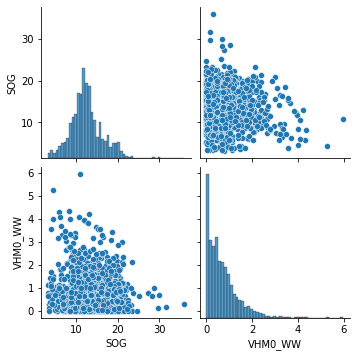

In [ ]:
import seaborn as sns
sns.pairplot(df[['SOG','VHM0_WW']])

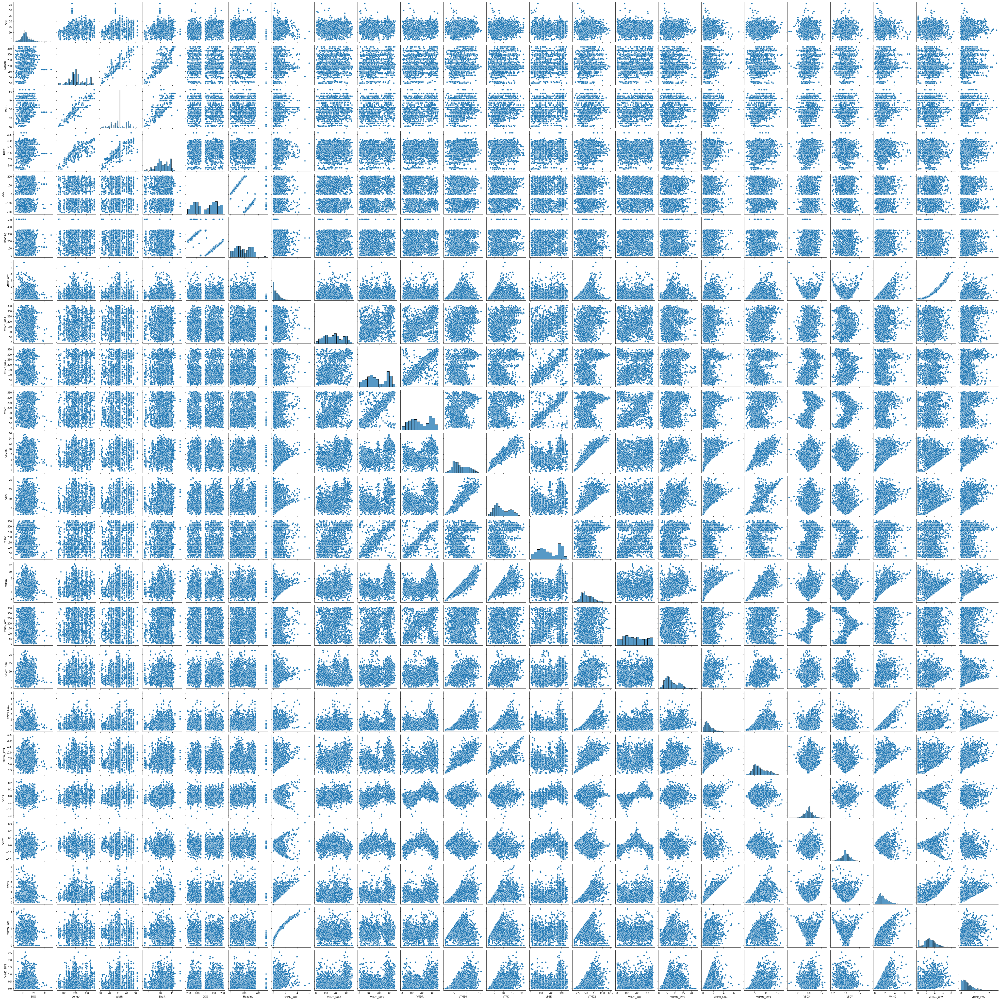

In [ ]:
sns.pairplot(df)

In [ ]:
# CMEMS Dictionaries

param_dict = {
    'VHM0': {'variable': 'Spectral significant wave height (Hm0)', 'unit': 'm'},
    'VMDR_WW': {'variable': 'Mean wind wave direction from', 'unit': 'degree'},
    'VHM0_WW': {'variable': 'Spectral significant wind wave height', 'unit': 'm'},
    'VMDR_SW1': {'variable': 'Mean primary swell wave direction from', 'unit': 'degree'},
    'VTM01_SW1':{'variable': 'Spectral moments (0,1) primary swell wave period', 'unit': 's'},
    'VMDR_SW2': {'variable': 'Mean secondary swell wave direction from', 'unit': 'degree'},
    'VTM01_SW2': {'variable': 'Spectral moments (0,1) secondary swell wave period', 'unit': 's'},
    'VMDR': {'variable': 'Mean wave direction from (Mdir)', 'unit': 'degree'},
    'VTM10': {'variable': 'Spectral moments (-1,0) wave period (Tm-10)', 'unit': 's'},
    'VHM0_SW1': {'variable': 'Spectral significant primary swell wave height', 'unit': 'm'},
    'VHM0_SW2': {'variable': 'Spectral significant secondary swell wave height', 'unit': 'm'},
    'VTPK': {'variable': 'Wave period at spectral peak / peak period (Tp)', 'unit': 's'},
    'VSDX': {'variable': 'Stokes drift U', 'unit': 'm/s'},
    'VSDY': {'variable': 'Stokes drift V', 'unit': 'm/s'},
    'VPED': {'variable': 'Wave principal direction at spectral peak', 'unit': 'degree'},
    'VTM02': {'variable': 'Spectral moments (0,2) wave period (Tm02)', 'unit': 's'},
    'VTM01_WW': {'variable': 'Spectral moments (0,1) wind wave period', 'unit': 's'}
}


time_dict = {
    0: '00 UTC',
    1: '03 UTC',
    2: '06 UTC',
    3: '09 UTC',
    4: '12 UTC',
    5: '15 UTC',
    6: '18 UTC',
    7: '21 UTC',
}

# Model

In [ ]:
import pandas as pd
# from pandas_datareader import data
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import r2_score

In [ ]:
# prepare dataframe
df = df.copy()
df = df.dropna()
df.info()